# Dermnet - Kamień milowy 2 (Feature engineering)
### 0. Pakiety

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import cv2

## 1. Import danych

In [2]:
df1 = pd.read_pickle('train_data_1.pkl')
df2 = pd.read_pickle('train_data_2.pkl')
df = pd.concat([df1, df2], axis=0)
X_train, X_val = train_test_split(df, test_size=0.3, random_state=42)

In [3]:
# to check if ok
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10889 entries, 7735 to 7270
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   10889 non-null  object
dtypes: object(1)
memory usage: 170.1+ KB


## Modyfikacja obrazów

In [3]:
random.seed(2137)
chosen_indexes = random.sample(range(len(X_train['image'])), 8)

In [4]:
def visualize_random_images(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img)
        ax.axis('off')

## 2. Grayscale

In [8]:
def convert_to_grayscale(data_frame, colname='image'):
    '''
    Convert the RGB images to grayscale
    '''
    result = []
    k=0
    for image in data_frame['image']:
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        gray = 0.33 * r + 0.33 * g + 0.33 * b
        result.append(gray)
    result = pd.DataFrame({colname : result})
    return result

In [9]:
X_train_grayscale = convert_to_grayscale(X_train)

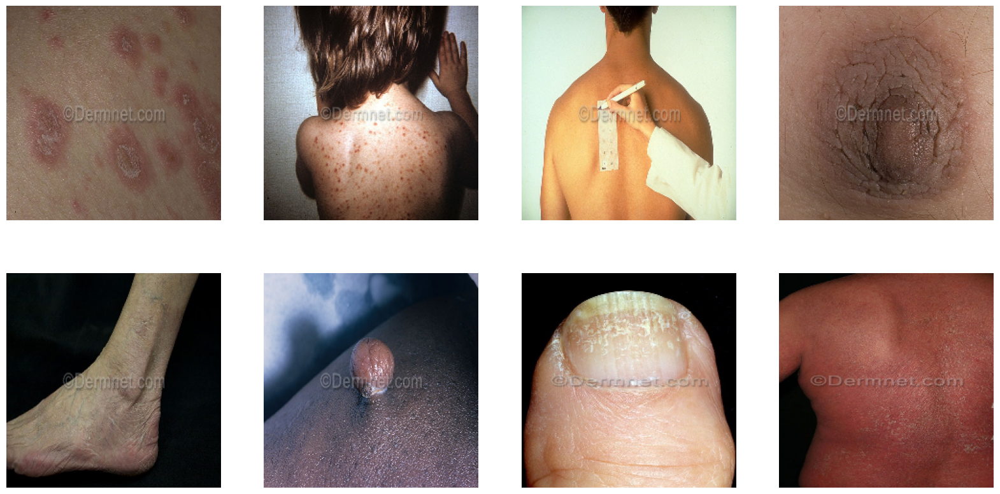

In [15]:
visualize_random_images(X_train, chosen_indexes)

In [10]:
def visualize_random_images_grey(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img, cmap='gray')
        ax.axis('off')

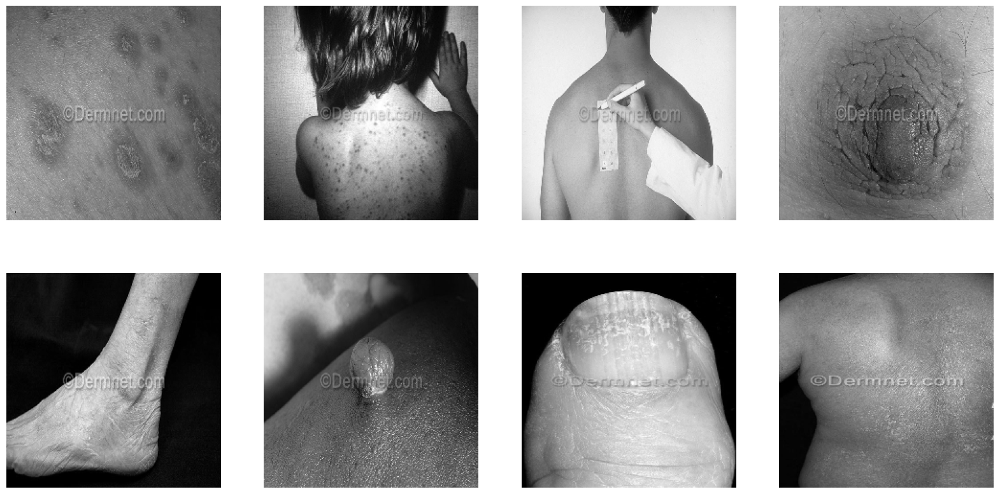

In [26]:
visualize_random_images_grey(X_train_grayscale, chosen_indexes)

## 3. RGB Channels
### 3.1. Red

In [11]:
def extract_rgb_channel(data_frame, colname='image', color='red'):
    '''
    Convert the RGB images to grayscale
    '''
    if color == 'red':
        channel = 0
    elif color == 'green':
        channel = 1
    elif color == 'blue':
        channel = 2
    result = []
    k=0
    for image in data_frame['image']:
        modified_image = np.zeros_like(image)
        modified_image[:,:,channel] = image[:,:,channel]
        result.append(modified_image)
    result = pd.DataFrame({colname : result})
    return result

In [34]:
X_train_red = extract_rgb_channel(X_train, color='red')

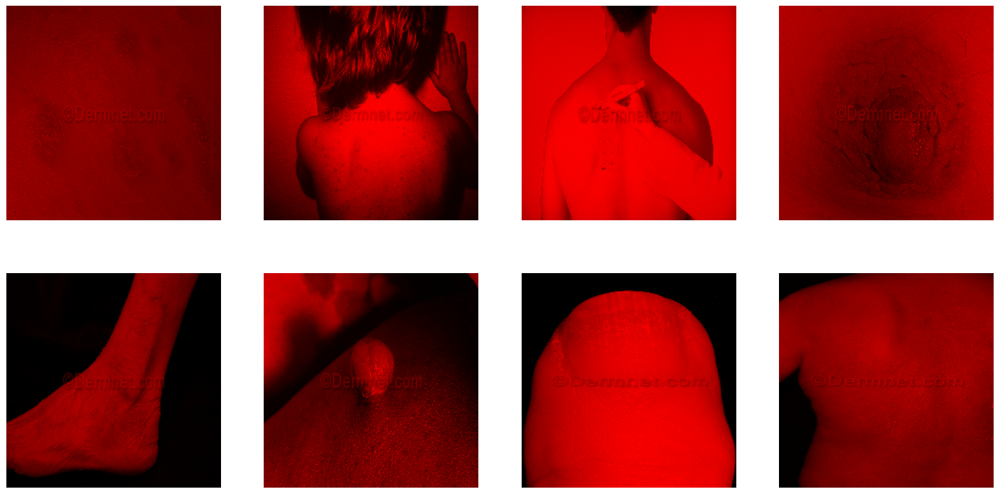

In [39]:
visualize_random_images(X_train_red, chosen_indexes)

### 3.1. Green

In [36]:
X_train_green = extract_rgb_channel(X_train, color='green')

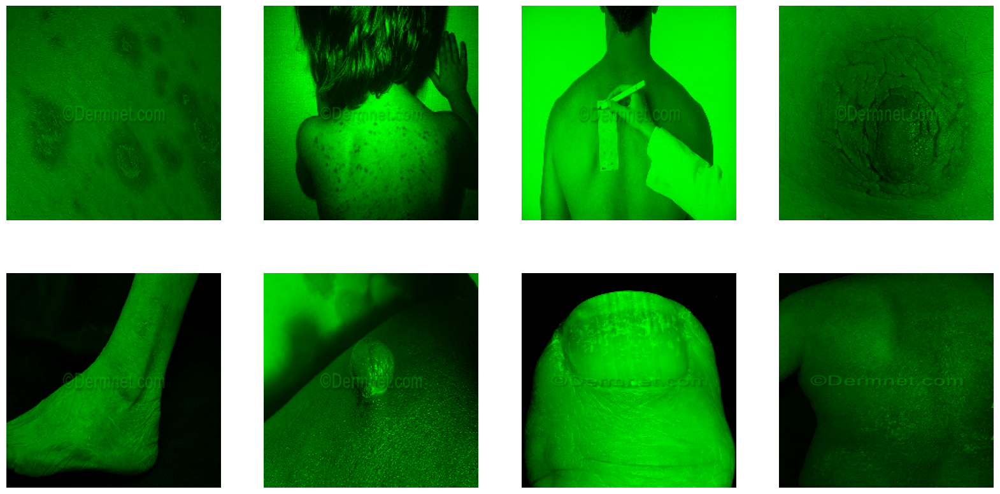

In [40]:
visualize_random_images(X_train_green, chosen_indexes)

### 3.3. Blue

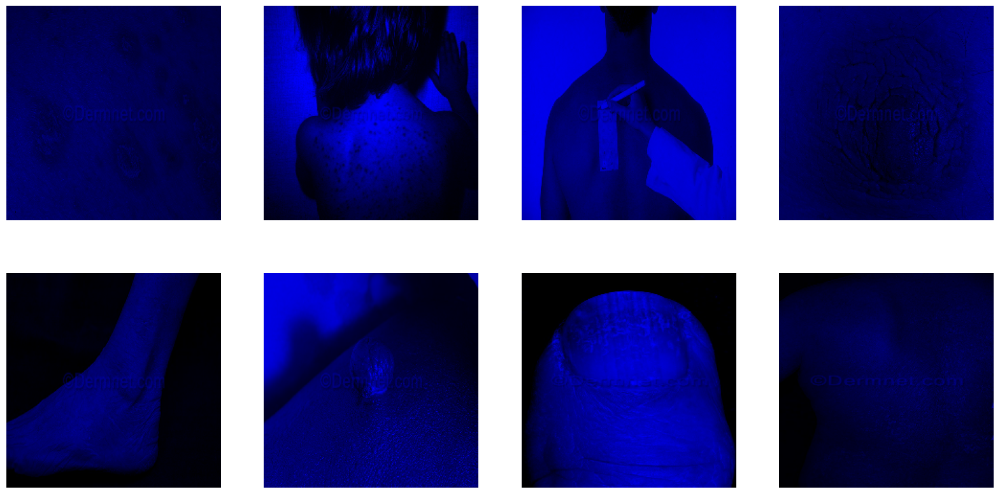

In [41]:
X_train_blue = extract_rgb_channel(X_train, color='blue')
visualize_random_images(X_train_blue, chosen_indexes)

## 4. Thresholding
### 4.1. globalny 

In [12]:
def global_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image > tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

thresh = 100

In [29]:
X_train_threshold_100 = global_threshold(X_train_grayscale, 100)

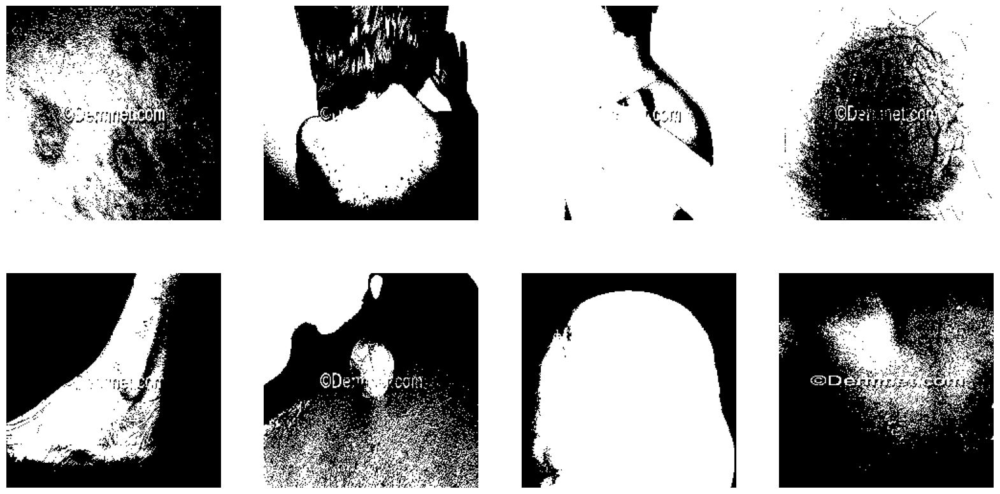

In [30]:
visualize_random_images_grey(X_train_threshold_100, chosen_indexes)

thresh = 150

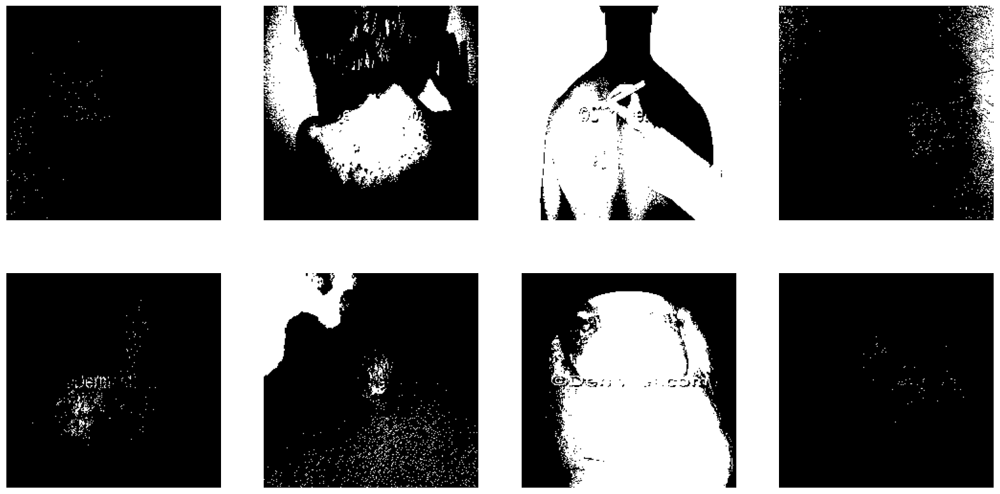

In [32]:
X_train_threshold_150 = global_threshold(X_train_grayscale, 150)
visualize_random_images_grey(X_train_threshold_150, chosen_indexes)

thresh = 125

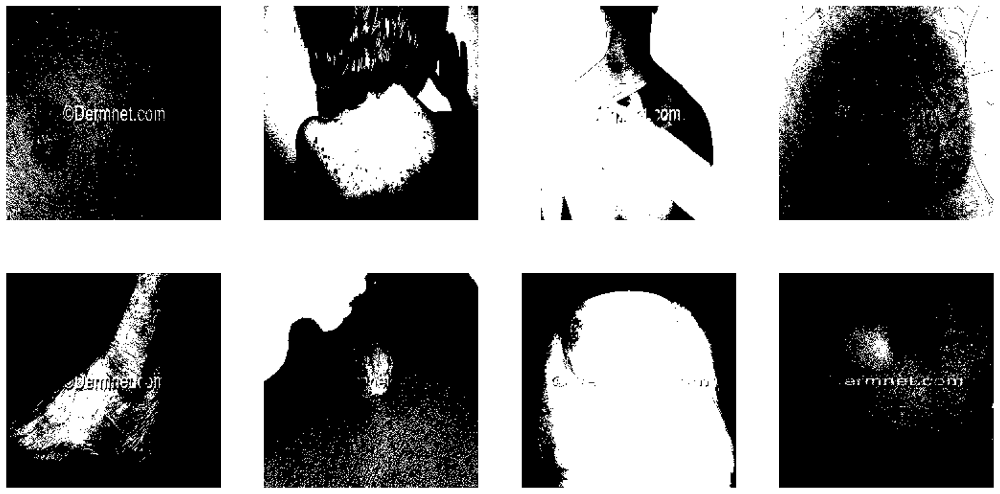

In [33]:
X_train_threshold_125 = global_threshold(X_train_grayscale, 125)
visualize_random_images_grey(X_train_threshold_125, chosen_indexes)

### 4.2. reverse thresholding

In [8]:
def reverse_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image > tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

thresh=100 (best)

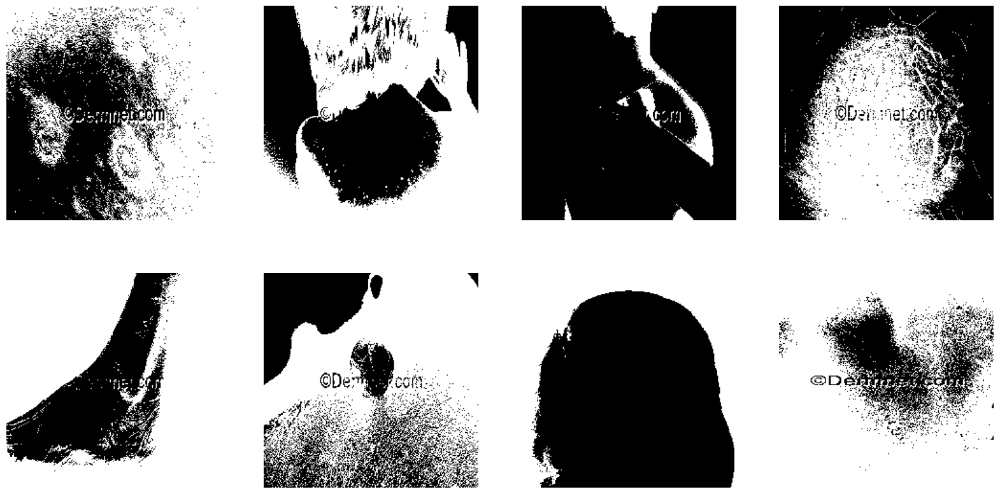

In [9]:
X_train_rev_threshold_100 = reverse_threshold(X_train_grayscale, 100)
visualize_random_images_grey(X_train_rev_threshold_100, chosen_indexes)

## 5. Edge detection

In [16]:
def detect_images(df, low_th = 50, high_th = 150, blur_ksize = 5, colname = 'image'):
    '''
    Runs edge detection on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        image = (image * 255).astype(np.uint8)
        blurred_image = cv2.GaussianBlur(image, (blur_ksize, blur_ksize), 0)

        edges = cv2.Canny(blurred_image, low_th, high_th)  
        result.append(edges)
    result = pd.DataFrame({colname : result})
    return result

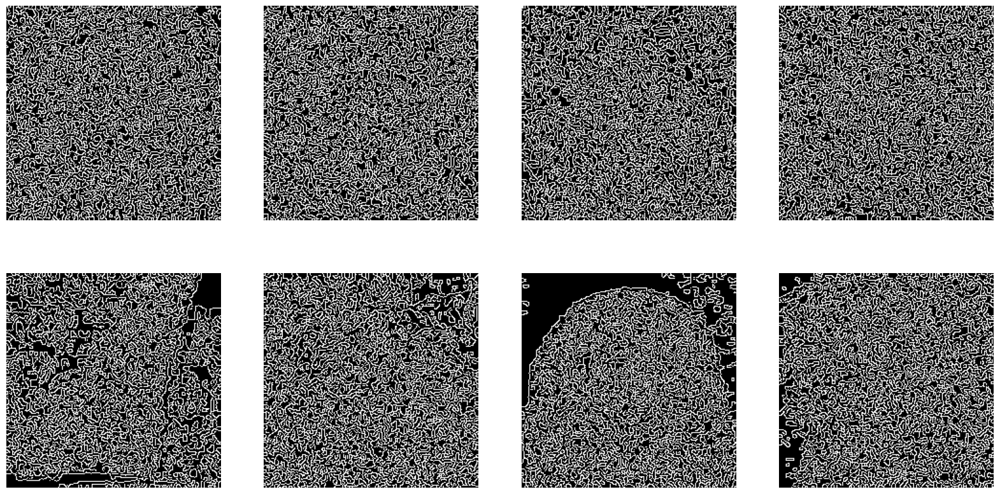

In [17]:
X_train_edges = detect_images(X_train_grayscale)
visualize_random_images_grey(X_train_edges, chosen_indexes)

## 6. Negative

In [5]:
def convert_to_negative_image(df, colname = 'image'):
    '''
    Converts the image to negative
    '''
    result = []
    for image in df[colname]:
        result.append(255 - image)
    result = pd.DataFrame({colname : result})
    return result

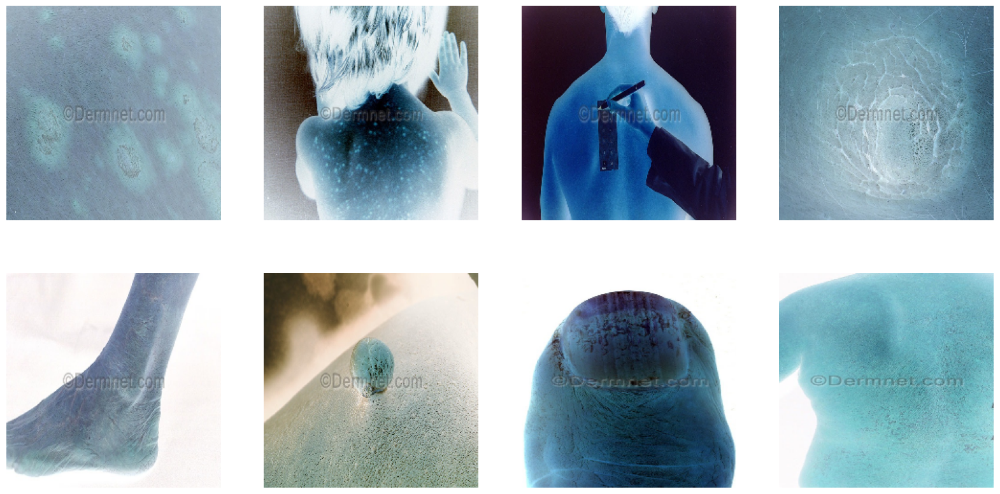

In [7]:
X_train_negative = convert_to_negative_image(X_train)
visualize_random_images(X_train_negative, chosen_indexes)